In [ ]:
!nvidia-smi

Fri Jan 15 08:57:37 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.27.04    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    42W / 300W |      0MiB / 16130MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## VAE

A Variational AutoEncoder (VAE) is composed of an encoder and a decoder. The difference with a regular AutoEncoder is about the latent space z. In fact, in the case of an AutoEncoder, the encoder will map each image into a fixed vector in the latent space z. In the case of a Variational AutoEncoder, the encoder will map the images into a distribution which allow random sampling. Usually, VAE will produce the mean $\mu$ and covariance $\sigma$ of a normal distribution, which allow to do random sampling. That's why VAE can generate "new" samples.

![image](https://lilianweng.github.io/lil-log/assets/images/vae-gaussian.png)

## Loss function :
https://lilianweng.github.io/lil-log/2018/08/12/from-autoencoder-to-beta-vae.html#vae-variational-autoencoder

Let's introduce some notations first : 
- x the input data, z the latent vector,  $p_\theta$ the distribution parametrized by $\theta$
- $q_\theta(z|x)$ represents the probabilistic encoder. It is the normal distribution based on the parameters $\mu$ and $\sigma$ produce by our encoder. This term try to approximate $p_\theta(z|x)$
- $p_\theta(x|z)$ represented by the probabilistic decoder

The loss function of the VAE can be divided into two terms :
- the reconstruction loss which minimize the error between real image and the generated image. The goal is to make the generated image as real as possible. We can use BCE or MSE for instance. 
- the KL divergence loss between $q_\theta(z|x)$ and $p(z)$ (which follow a Normal distribution $N(0,1)$. If we ignore this term, it is similar to have a regular AE, so no new images could be generated.


# Download dataset

In [ ]:
import os

In [ ]:
if "kagglecatsanddogs_3367a.zip" not in os.listdir():
  !wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_3367a.zip
  !unzip kagglecatsanddogs_3367a.zip
  !rm "PetImages/Dog/Thumbs.db"

# Functions

In [ ]:
import os
import torch
from torch import nn
from torch.nn import functional as F
from torch.distributions.kl import kl_divergence as kld
from torch.utils.data import DataLoader
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from torchvision.utils import make_grid


In [ ]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.axis('off')
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    return image_grid.permute(1,2,0).numpy()


In [ ]:
class Dataset(torch.utils.data.Dataset):
  def __init__(self, paths, resize=224):
    self.paths = paths
    self.resize = resize
  def __getitem__(self, idx):
    img = cv2.resize(cv2.imread(self.paths[idx]), (self.resize, self.resize))
    #print(img.shape)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = torch.as_tensor(img).permute(2,0,1)/255.0
    #print(img.shape)
    return img
  
  def __len__(self):
    return len(self.paths)

# Models

In [ ]:
from torch.distributions.normal import Normal

class VAE(nn.Module):
  def __init__(self, input_channels=3, output_channels_enc = [32, 64, 128, 256, 256], kernel_sizes_enc=[4, 4, 4, 4, 4, 4], strides_enc=[2,2,3,2,2,2],
               hidden_size=2048, output_channels_dec=[512, 256, 128], kernel_sizes_dec=[3,4,4,3], strides_dec=[2,3,3,2], z_dim=256):
    super(VAE, self).__init__()
    self.encoder = self.make_encode(input_channels=input_channels, output_channels=output_channels_enc, kernel_sizes=kernel_sizes_enc, strides=strides_enc)
    self.decoder = self.make_decode(image_dim=input_channels, input_channels=z_dim, output_channels=output_channels_dec, kernel_sizes=kernel_sizes_dec,
                                    strides=strides_dec)
    self.mu_ = nn.Linear(hidden_size, z_dim)
    self.stddev_ = nn.Linear(hidden_size, z_dim)
    self.hidden_size = hidden_size
    self.z_dim = z_dim
  def make_encode(self, input_channels=3, output_channels=[32, 64, 128, 256, 256], 
                  kernel_sizes=[3, 4, 3, 4, 3], strides=[2,3,2,3,2]):
    layers = []
    for i in range(len(output_channels)):
      if i == 0:
        layers.append( nn.Sequential(
                      nn.Conv2d(input_channels, output_channels[i], kernel_sizes[i], strides[i]),
                      nn.BatchNorm2d(output_channels[i]),
                      #nn.InstanceNorm2d(output_channels[i]),
                      nn.LeakyReLU(0.2, inplace=True),
                      ) )

      else:
        layers.append( nn.Sequential(
                      nn.Conv2d(output_channels[i-1], output_channels[i], kernel_sizes[i], strides[i]),
                      nn.BatchNorm2d(output_channels[i]),
                      #nn.InstanceNorm2d(output_channels[i]),
                      nn.LeakyReLU(0.2, inplace=True),
                      ) )
    return nn.Sequential(*layers)

  def make_decode(self, image_dim, input_channels, output_channels=[512, 256, 128, 64], kernel_sizes=[3,4,4,4,3], strides=[2,3,3,3, 2]):
    layers = []

    for i in range(len(output_channels)-1):
      if i == 0:
            layers.append(nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels[i], kernel_sizes[i], strides[i]),
                nn.BatchNorm2d(output_channels[i]),
                nn.ReLU(inplace=True),
                # nn.Conv2d(output_channels[i], output_channels[i], 3, 1, padding=1),
                # nn.BatchNorm2d(output_channels[i]),
                # nn.ReLU(inplace=True),
            ))
      else:
        layers.append(nn.Sequential(
                nn.ConvTranspose2d(output_channels[i-1], output_channels[i], kernel_sizes[i], strides[i]),
                nn.BatchNorm2d(output_channels[i]),
                nn.ReLU(inplace=True),
                # nn.Conv2d(output_channels[i], output_channels[i], 3, 1, padding=1),
                # nn.BatchNorm2d(output_channels[i]),
                # nn.ReLU(inplace=True),
            ))
    layers.append(nn.Sequential(
                nn.ConvTranspose2d(output_channels[i], output_channels[i+1], kernel_sizes[i+1], strides[i+1]),
                nn.ReLU(inplace=True),
                nn.Conv2d(output_channels[i+1], image_dim, 5, stride=1, padding=2),
                nn.Sigmoid(),
            ))

    return nn.Sequential(*layers)

            
  def forward(self, x):
    enc = self.encoder(x)
    #print(enc.shape)
    enc = enc.view(x.shape[0], -1)
    #print(enc.shape)
    mu = self.mu_(enc)
    std = torch.exp(self.stddev_(enc)/2.0)
    q_dist = Normal(mu, std)
    z = q_dist.rsample()
    #print(z.shape)
    dec = self.decoder(z.unsqueeze(-1).unsqueeze(-1))
    #print(dec.shape)
    return dec, q_dist # image between 0 and 1

In [ ]:
model = VAE(input_channels=3, output_channels_enc = [32, 64, 128, 256], kernel_sizes_enc=[4, 4, 4, 4], strides_enc=[2,2,2, 2],
                hidden_size=9216, output_channels_dec=[512, 256, 128, 64, 32, 16], kernel_sizes_dec=[3,3,3,3,3,4], strides_dec=[2,2,2,2,2,2,2], z_dim=1024)

In [ ]:
X = torch.as_tensor(np.random.uniform(0,1,(4,3,128,128))).float()
model(X)[0].shape

torch.Size([4, 3, 128, 128])

# Loss VAE

In [ ]:
# The reconstruction loss can use a bce
reconstruction_loss = nn.BCELoss(reduction="sum")#nn.L1Loss(reduction="sum")#

In [ ]:
# KL divergence
def kl_div_vae(q_dist):
  return kld(q_dist, Normal(torch.zeros_like(q_dist.mean), torch.ones_like(q_dist.stddev))).sum(-1).sum()

# Parameters

In [ ]:
dogs_path = []
# filter corrupted image
for x in tqdm(list(sorted(os.listdir("PetImages/Dog/")))):
  if cv2.imread("PetImages/Dog/" + x) is not None:
    dogs_path.append("PetImages/Dog/" + x )

In [ ]:
batch_size = 64
resize = 128
dataset = Dataset(dogs_path, resize=resize)
z_dim = 4096
epochs = 1000
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=4)
device = "cuda"
lr = 1e-4
display_steps=300

In [ ]:
len(dogs_path)

12470

In [ ]:
torch.__version__

'1.7.0+cu101'

In [ ]:
model = VAE(input_channels=3, output_channels_enc = [32, 64, 128, 256], kernel_sizes_enc=[4, 4, 4, 4], strides_enc=[2,2,2, 2],
                hidden_size=9216, output_channels_dec=[512, 256, 128, 64, 32, 16], kernel_sizes_dec=[3,3,3,3,3,4], strides_dec=[2,2,2,2,2,2,2], z_dim=z_dim)

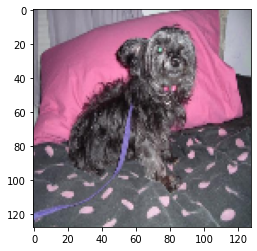

In [ ]:
plt.imshow(dataset[0].permute(1,2,0))

In [ ]:
X = torch.as_tensor(np.random.uniform(0,1,(4,3,resize,resize))).float()
model(X)[0].shape

torch.Size([4, 3, 128, 128])

In [ ]:
model = model.to(device)

In [ ]:
opt = torch.optim.Adam(model.parameters(), lr=lr, amsgrad=False)

# Training

In [ ]:
try: 
  os.makedirs("drive/MyDrive/VAE_{0}".format(resize))
except:
  pass


Epochs : 0


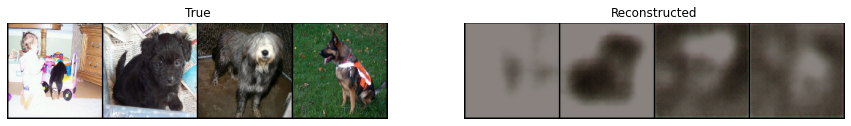


Epochs : 1


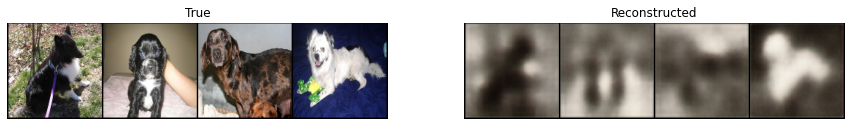


Epochs : 2


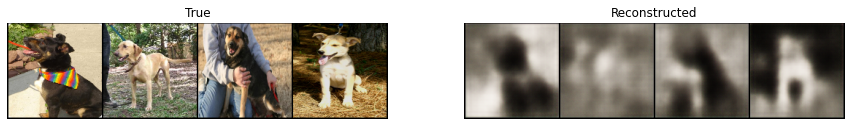


Epochs : 3


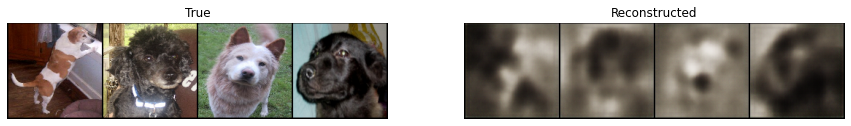


Epochs : 4


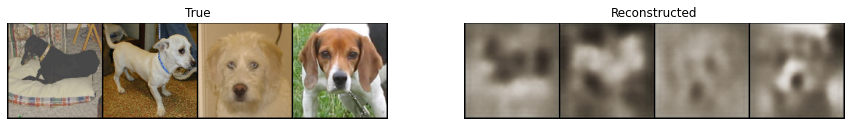


Epochs : 5


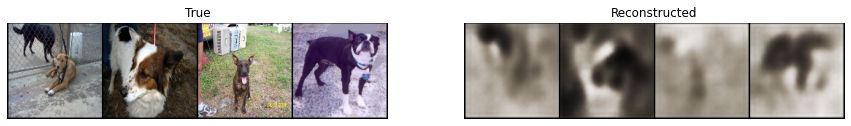


Epochs : 6


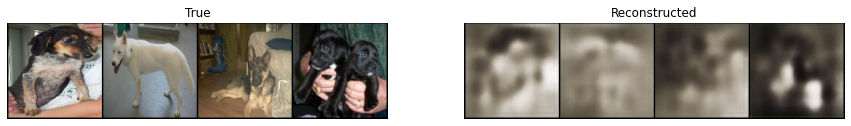


Epochs : 7


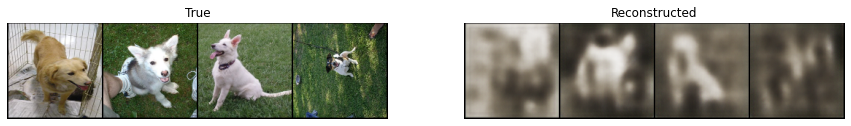


Epochs : 8


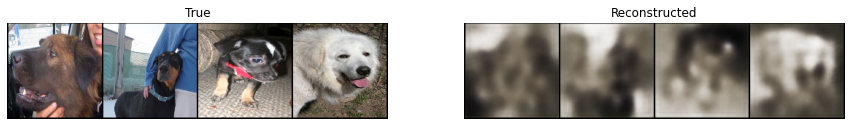


Epochs : 9


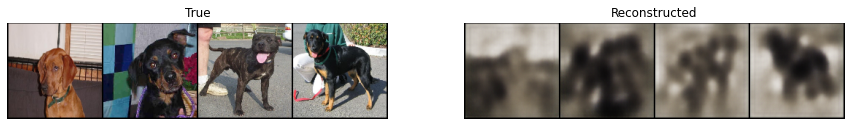


Epochs : 10


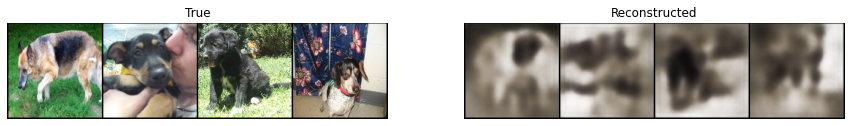


Epochs : 11


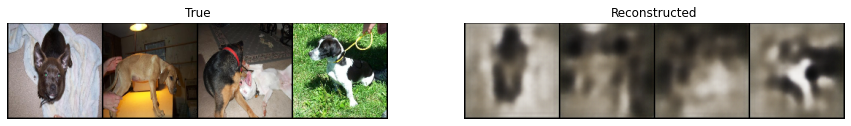


Epochs : 12


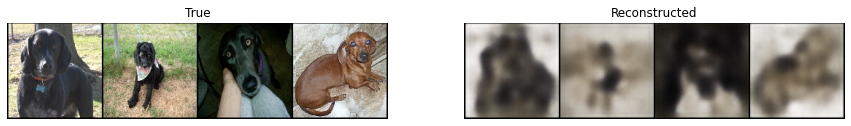


Epochs : 13


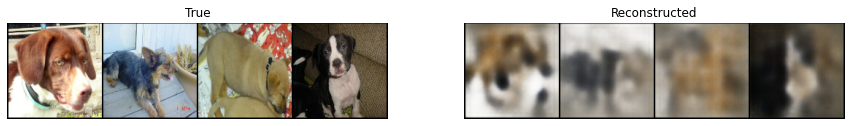


Epochs : 14


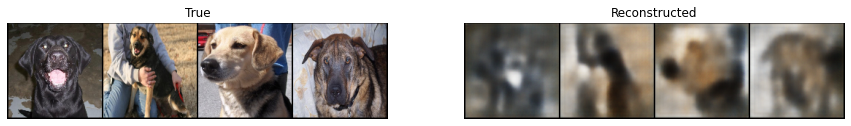


Epochs : 15


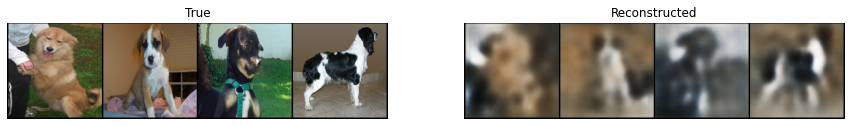


Epochs : 16


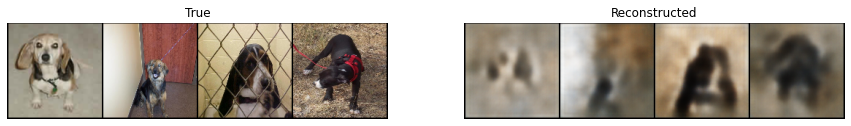


Epochs : 17


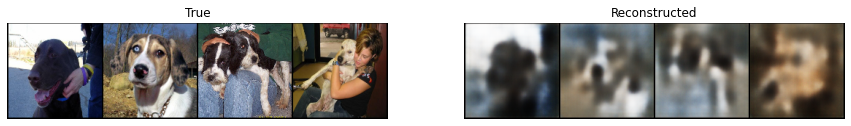


Epochs : 18


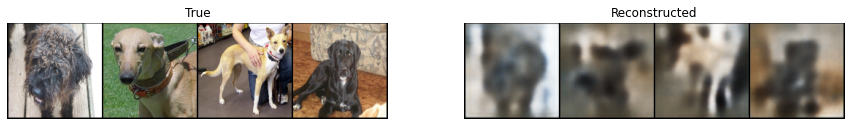


Epochs : 19


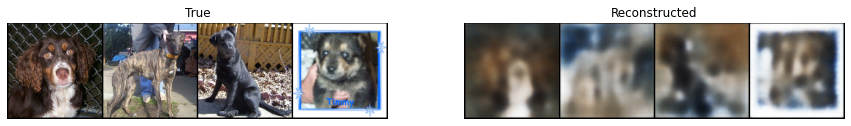


Epochs : 20


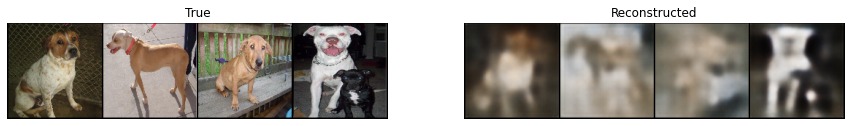


Epochs : 21


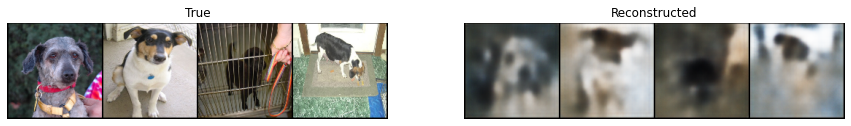


Epochs : 22


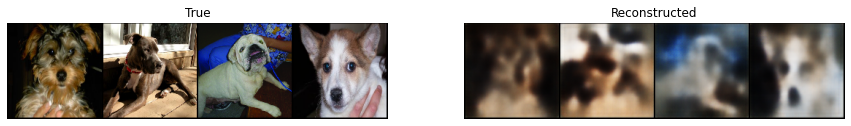


Epochs : 23


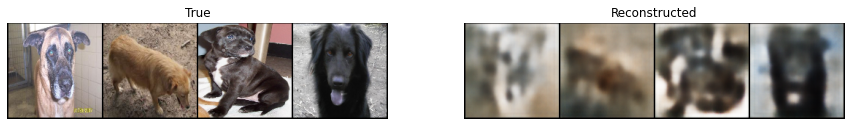


Epochs : 24


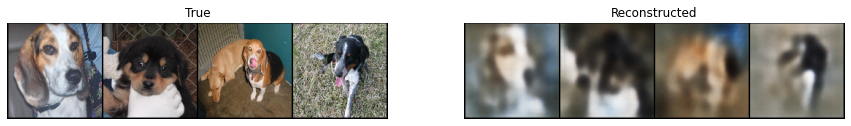


Epochs : 25


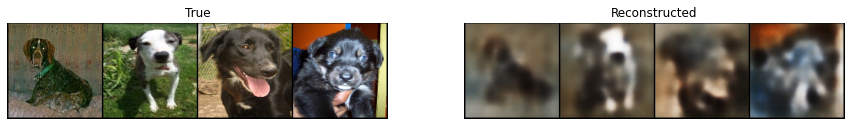


Epochs : 26


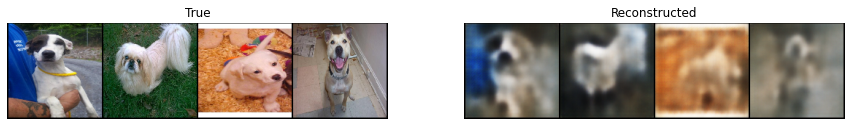


Epochs : 27


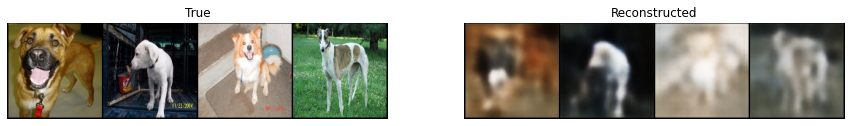


Epochs : 28


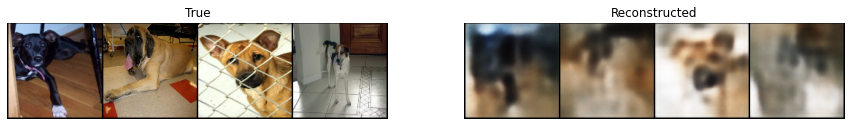


Epochs : 29


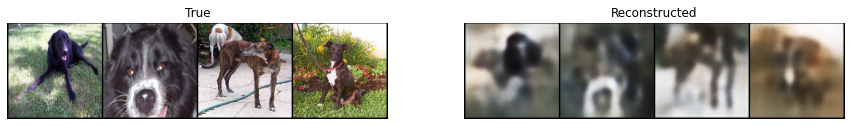


Epochs : 30


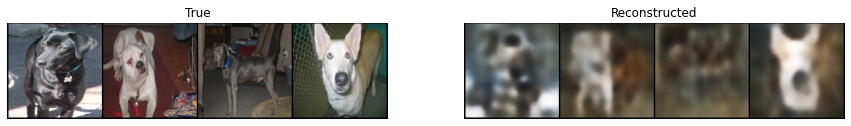


Epochs : 31


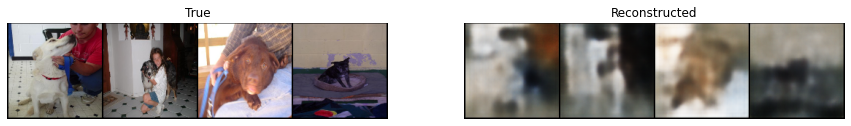


Epochs : 32


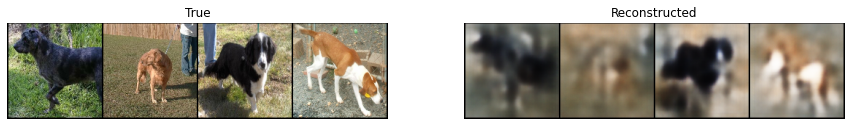


Epochs : 33


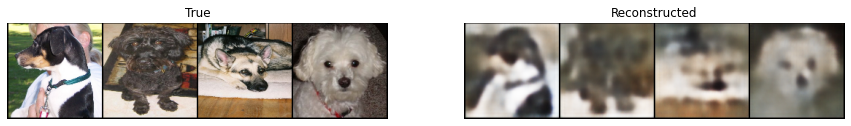


Epochs : 34


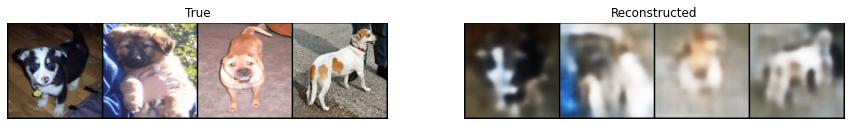


Epochs : 35


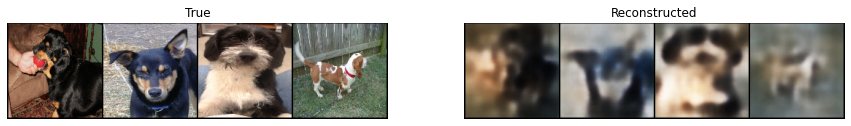


Epochs : 36


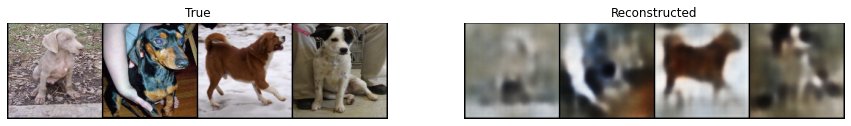


Epochs : 37


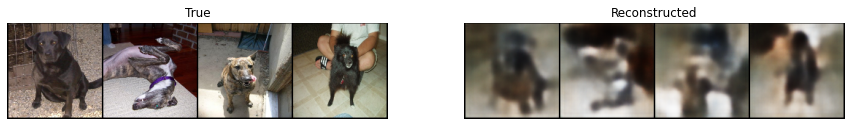


Epochs : 38


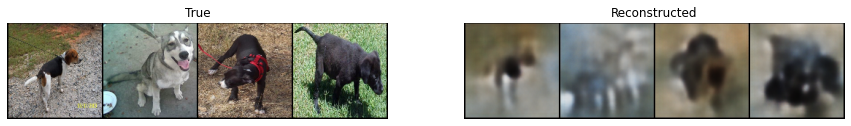


Epochs : 39


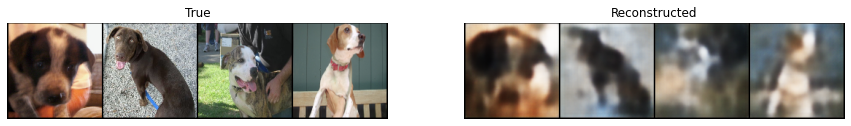


Epochs : 40


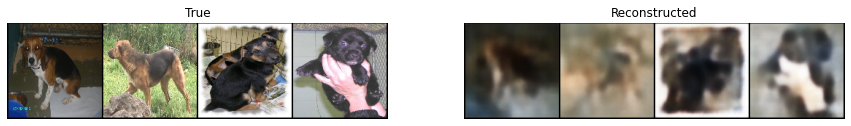


Epochs : 41


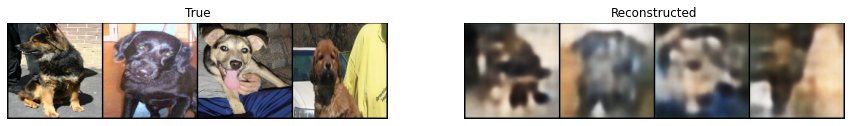


Epochs : 42


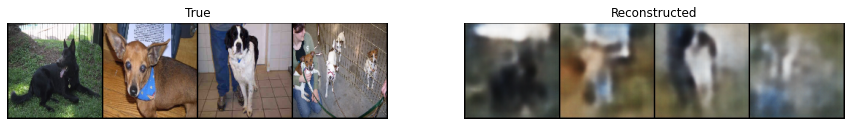


Epochs : 43


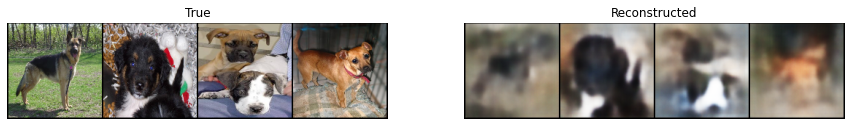


Epochs : 44


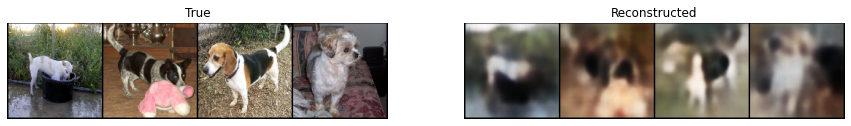


Epochs : 45


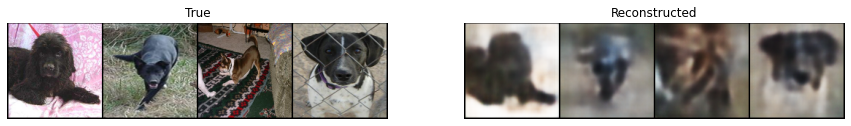


Epochs : 46


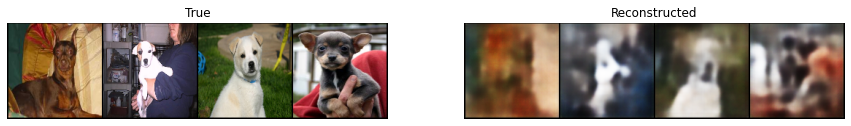


Epochs : 47


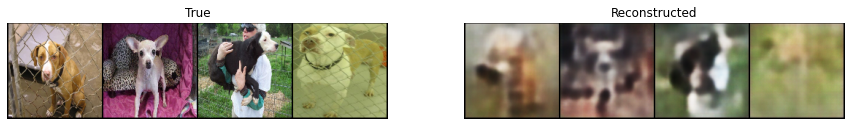


Epochs : 48


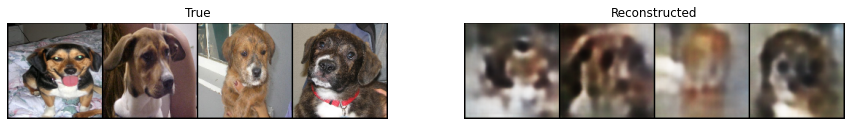


Epochs : 49


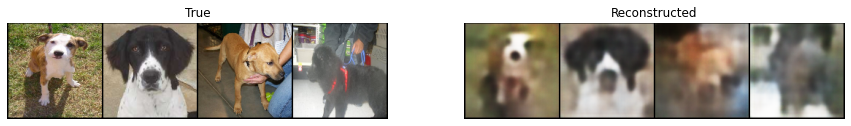


Epochs : 50


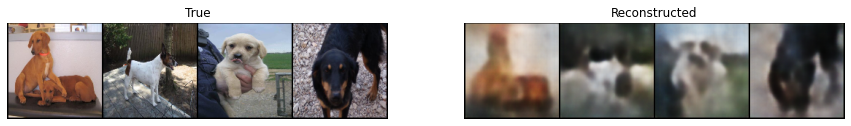


Epochs : 51


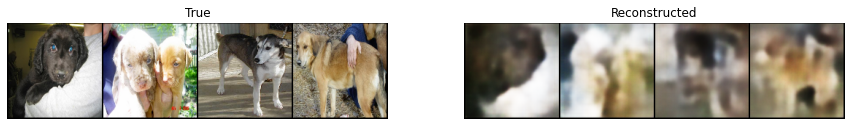


Epochs : 52


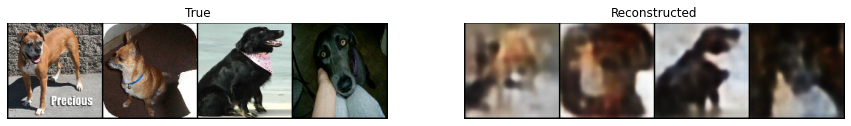


Epochs : 53


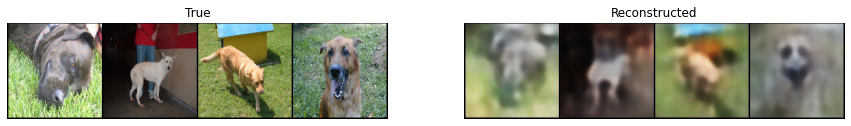


Epochs : 54


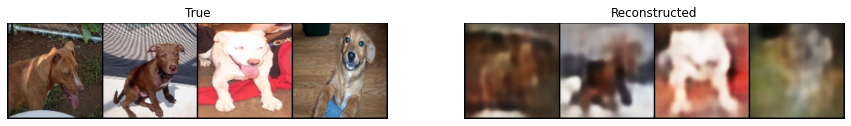


Epochs : 55


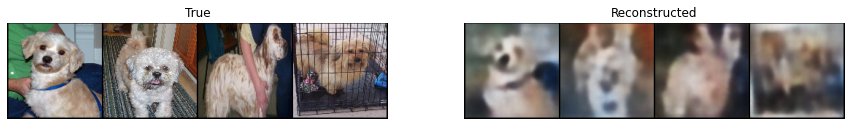


Epochs : 56


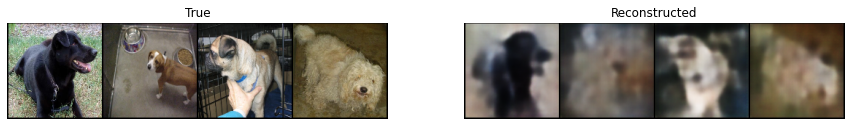


Epochs : 57


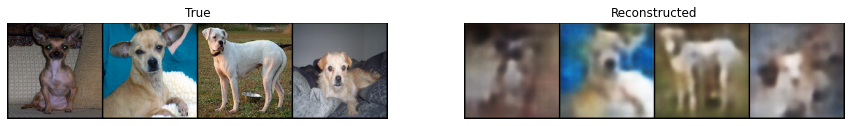


Epochs : 58


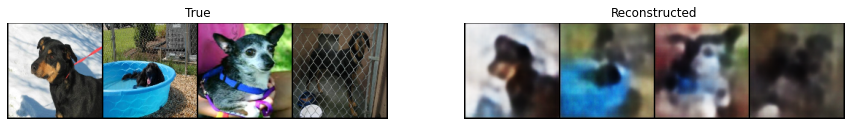


Epochs : 59


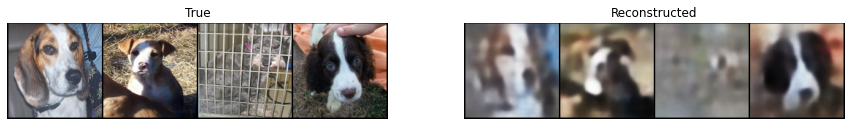


Epochs : 60


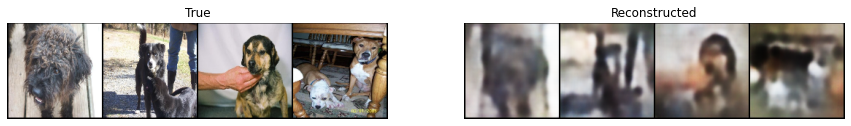


Epochs : 61


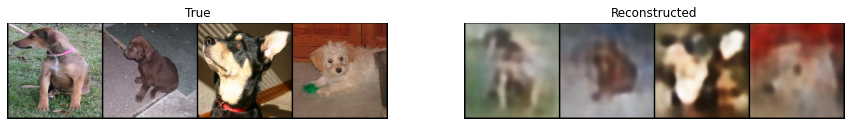


Epochs : 62


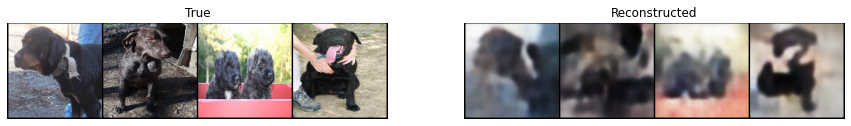


Epochs : 63


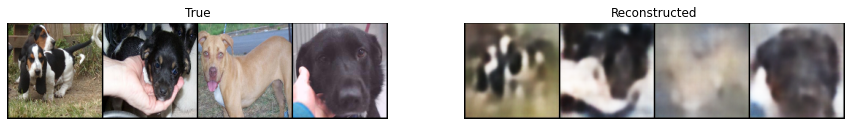


Epochs : 64


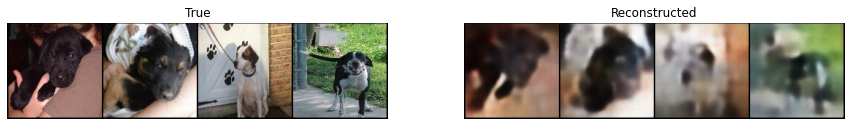


Epochs : 65


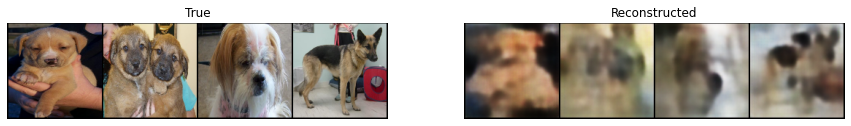


Epochs : 66


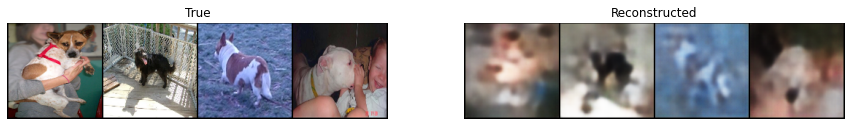


Epochs : 67


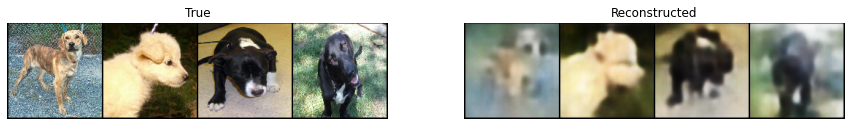


Epochs : 68


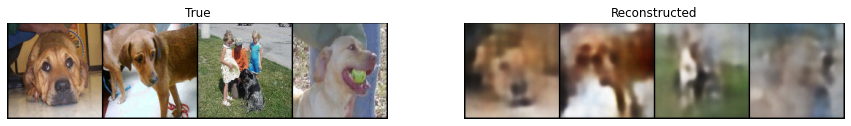


Epochs : 69


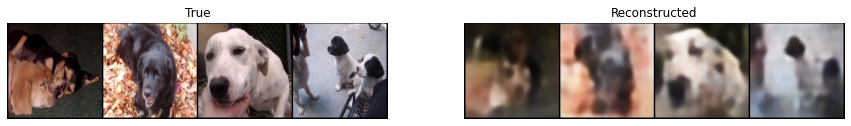


Epochs : 70


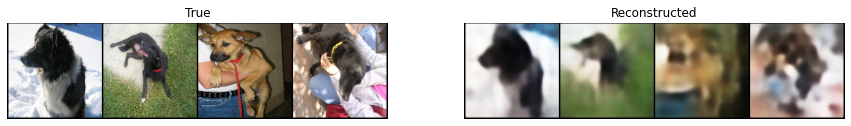


Epochs : 71


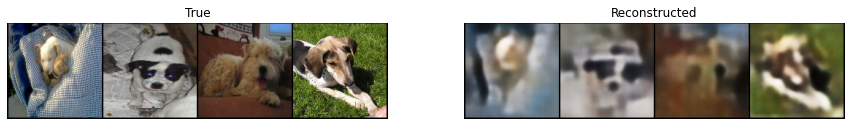


Epochs : 72


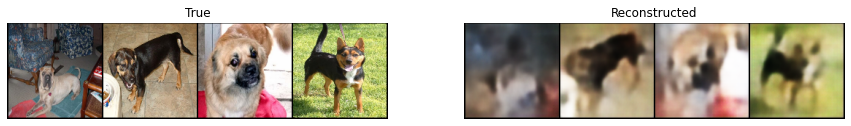


Epochs : 73


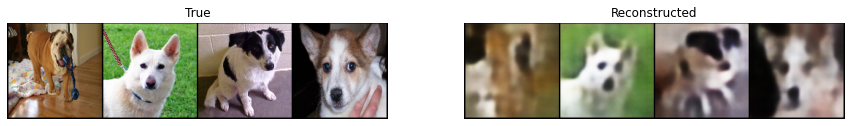


Epochs : 74


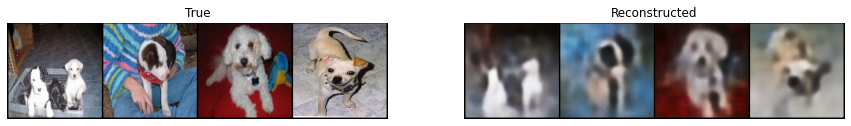


Epochs : 75


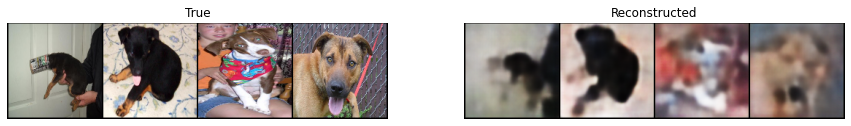


Epochs : 76


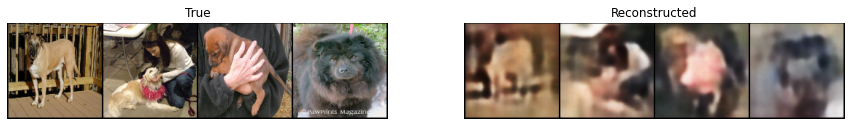

Buffered data was truncated after reaching the output size limit.

In [ ]:
curr_steps = 0
best_loss = np.inf
for e in range(epochs):
  total_loss = 0
  t = tqdm(dataloader)
  for i, images in enumerate(t):
    images = images.to(device)
    opt.zero_grad()
    generated_images, q_dist = model(images)
    loss = (1 * reconstruction_loss(generated_images, images ) + kl_div_vae(q_dist))/batch_size
    loss.backward()
    opt.step()
    total_loss += loss.item()
    t.set_description("Loss : {0}".format(total_loss/(i+1)))
    t.refresh()
  if best_loss > total_loss:
    best_loss = total_loss
    torch.save(model.state_dict(), "drive/MyDrive/VAE-weights.pth")
  print(f"Epochs : {e}")
  plt.figure(figsize=(15,15))
  plt.subplot(1,2,1)
  im1 = show_tensor_images(images, num_images=4)* 255
  plt.title("True")
  plt.subplot(1,2,2)
  im2 = show_tensor_images(generated_images, num_images=4)* 255
  plt.title("Reconstructed")
  plt.show()
  im_v = cv2.vconcat([im1.astype(np.uint8), im2.astype(np.uint8)])
  cv2.imwrite("drive/MyDrive/VAE_{0}/image_{1}.jpg".format(resize, e), im_v[:, :, ::-1])

Epochs : 999


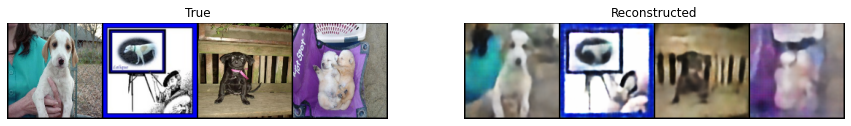

In [ ]:
print(f"Epochs : {e}")
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
show_tensor_images(images, num_images=4)
plt.title("True")
plt.subplot(1,2,2)
show_tensor_images(generated_images, num_images=4)
plt.title("Reconstructed")
plt.show()